In [1]:
#pip install plotly
#pip install kaleido

In [2]:
# import libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker
import plotly.graph_objects as pgo
import kaleido
from PIL import Image
from IPython.display import Image as ipimage

In [3]:
# creating the dataframe
df = pd.read_csv('.//datasets/Measurement_summary.csv')

df.head()

# original data from https://www.kaggle.com/datasets/bappekim/air-pollution-in-seoul

,Measurement date,Station code,Address,Latitude,Longitude,SO2,NO2,O3,CO,PM10,PM2.5
0,2017-01-01 00:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.059,0.002,1.2,73.0,57.0
1,2017-01-01 01:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.058,0.002,1.2,71.0,59.0
2,2017-01-01 02:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,59.0
3,2017-01-01 03:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.004,0.056,0.002,1.2,70.0,58.0
4,2017-01-01 04:00,101,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008,0.003,0.051,0.002,1.2,69.0,61.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 647511 entries, 0 to 647510
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Measurement date  647511 non-null  object 
 1   Station code      647511 non-null  int64  
 2   Address           647511 non-null  object 
 3   Latitude          647511 non-null  float64
 4   Longitude         647511 non-null  float64
 5   SO2               647511 non-null  float64
 6   NO2               647511 non-null  float64
 7   O3                647511 non-null  float64
 8   CO                647511 non-null  float64
 9   PM10              647511 non-null  float64
 10  PM2.5             647511 non-null  float64
dtypes: float64(8), int64(1), object(2)
memory usage: 54.3+ MB


Not missing data, data is object type instead of data type

In [5]:
# checking number of stations
df['Station code'].nunique()

25

In [6]:
# creating a list of stations

list_scode = list(set(df['Station code']))              # use set to avoid multiple occurrences and stored in order
list_scode

[101,
 102,
 103,
 104,
 105,
 106,
 107,
 108,
 109,
 110,
 111,
 112,
 113,
 114,
 115,
 116,
 117,
 118,
 119,
 120,
 121,
 122,
 123,
 124,
 125]

In [7]:
# process address data for a better labeling in charts

list_add = list(df['Address'])
district = [i.split(', ') [2] for i in list_add]        # splitting the string address into smaller items
df['district'] = district                               # creating a new columns with the district (first word)

In [8]:
# checking unique districts
df['district'].nunique()

25

In [9]:
# creating a list with the unique districts

list_district = list(set(district))

In [10]:
# creating three new columns with data formats

# spliting to creat list for Year-Month, Year and Month
list_ym = [i.split(" ")[0][:-3] for i in list(df['Measurement date'])]   
##split starting in the first character(0) to 3 three character before space

list_year = [i.split(" ")[0][0:4] for i in list(df['Measurement date'])]
## split starting in the first character(0) taking the first 4 character

list_month = [i.split(" ")[0][5:7] for i in list(df['Measurement date'])]
## split starting in the first character(0) taking from 5th to 7th character

# creating the new columns
df['ym']    = list_ym
df['year']  = list_year
df['month'] = list_month

# create monthly dataframe
df_monthly = df.groupby(['Station code', 'district', 'ym', 'year', 'month']).mean()

In [11]:
# checking the dataframe's format 
df_monthly

Latitude   Longitude       SO2  \
Station code district    ym      year month                                    
101          Jongno-gu   2017-01 2017 01     37.572016  127.005008  0.004401   
                         2017-02 2017 02     37.572016  127.005008 -0.022152   
                         2017-03 2017 03     37.572016  127.005008  0.005015   
                         2017-04 2017 04     37.572016  127.005008  0.003308   
                         2017-05 2017 05     37.572016  127.005008  0.003461   
...                                                ...         ...       ...   
125          Gangdong-gu 2019-08 2019 08     37.544962  127.136792  0.005264   
                         2019-09 2019 09     37.544962  127.136792 -0.010603   
                         2019-10 2019 10     37.544962  127.136792  0.003179   
                         2019-11 2019 11     37.544962  127.136792  0.003303   
                         2019-12 2019 12     37.544962  127.136792  0.003443   

                                                  NO2        O3        CO  \
Station code district    ym      year month                                 
101          Jongno-gu   2017-01 2017 01     0.037481  0.014972  0.695968   
                         2017-02 2017 02     0.010290 -0.008138  0.600000   
                         2017-03 2017 03     0.041267  0.026862  0.698118   
                         2017-04 2017 04     0.034699  0.033512  0.598056   
                         2017-05 2017 05     0.031724  0.039319  0.490591   
...                                               ...       ...       ...   
125          Gangdong-gu 2019-08 2019 08     0.017182  0.026261  0.599189   
                         2019-09 2019 09     0.005673  0.010133  0.367791   
                         2019-10 2019 10     0.024047  0.018567  0.432392   
                         2019-11 2019 11     0.035814  0.011037  0.567083   
                         2019-12 2019 12     0.036359  0.009333  0.666257   

                                                  PM10      PM2.5  
Station code district    ym      year month                        
101          Jongno-gu   2017-01 2017 01     51.024194  35.118280  
                         2017-02 2017 02     41.970238  28.857143  
                         2017-03 2017 03     55.146505  40.311828  
                         2017-04 2017 04     50.769444  26.536111  
                         2017-05 2017 05     55.129032  22.680108  
...                                                ...        ...  
125          Gangdong-gu 2019-08 2019 08     24.952703  19.087838  
                         2019-09 2019 09     20.604294  12.699387  
                         2019-10 2019 10     35.092742  17.689516  
                         2019-11 2019 11     49.201389  23.179167  
                         2019-12 2019 12     49.051913  39.494536  

[900 rows x 8 columns]

In [12]:
# shaping the object
df_monthly = df_monthly[['SO2', 'NO2', 'O3', 'CO', 'PM10', 'PM2.5']].reset_index()

df_monthly.head()


,Station code,district,ym,year,month,SO2,NO2,O3,CO,PM10,PM2.5
0,101,Jongno-gu,2017-01,2017,01,0.004401,0.037481,0.014972,0.695968,51.024194,35.118280
1,101,Jongno-gu,2017-02,2017,02,-0.022152,0.010290,-0.008138,0.600000,41.970238,28.857143
2,101,Jongno-gu,2017-03,2017,03,0.005015,0.041267,0.026862,0.698118,55.146505,40.311828
3,101,Jongno-gu,2017-04,2017,04,0.003308,0.034699,0.033512,0.598056,50.769444,26.536111
4,101,Jongno-gu,2017-05,2017,05,0.003461,0.031724,0.039319,0.490591,55.129032,22.680108


Latitude and lingitude were droped from the dataframe <br>
The object was de-aggregated

______________________________________________________________________________________
**plotting** data using lines and areas 

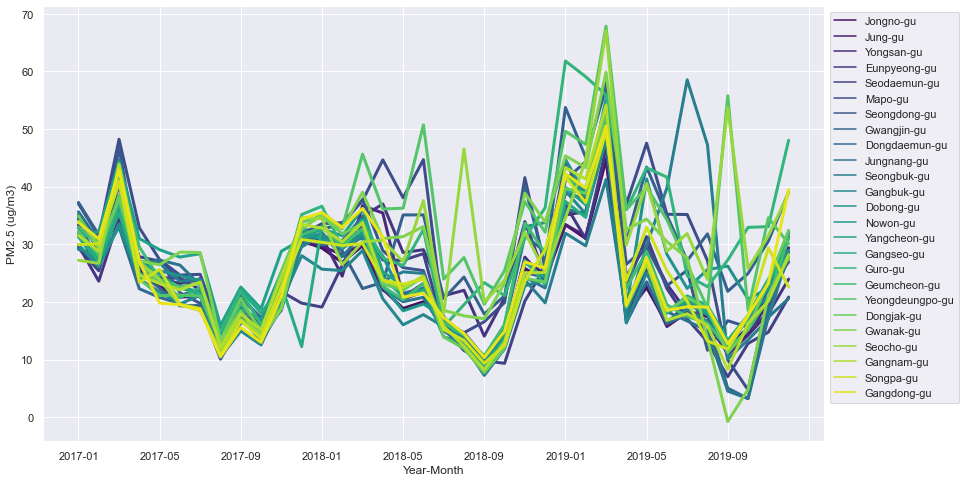

In [13]:
# creating the first multiple time series plot

# setting the shape
sns.set_style('darkgrid')
sns.set(rc={'figure.figsize':(14,8)})

# defining the variables
ax = sns.lineplot(data=df_monthly, x='ym', y='PM2.5',
                  hue='district', palette='viridis',
                  legend='full', lw=3)

# generating the plot
ax.xaxis.set_major_locator(ticker.MultipleLocator(4))
plt.legend(bbox_to_anchor =(1,1))
plt.ylabel('PM2.5 (ug/m3)')
plt.xlabel('Year-Month')
plt.show()

This is an example of a **very hard** to understand plot
_______________________________________________________________________________________________

In [14]:
# extract color palette - change color palette
pal = list(sns.color_palette(palette='viridis', n_colors=len(list_scode)).as_hex()) 
## using the lenght of the district's list

# creating the new plot using a for loop
fig = pgo.Figure()
for d,p in zip(list_district, pal):
    fig.add_trace(pgo.Scatter(x = df_monthly[df_monthly['district']==d]['ym'],
                             y = df_monthly[df_monthly['district']==d]['PM2.5'],
                             name = d,
                             line_color = p,
                             fill = None))                      #tozeroy

fig.show()

Initially all the districts appear in the chart. <br>
All districts can be deactivated with **double click** in the list<br>
Anyone can be **activated** just clicking in the name<br>
Putting the **mouse pointer** in each point in the chart the information about the date and variable values appear in the screen

In [15]:
# creating the new plot using a for loop
fig = pgo.Figure()
for d,p in zip(list_district, pal):
    fig.add_trace(pgo.Scatter(x = df_monthly[df_monthly['district']==d]['ym'],
                             y = df_monthly[df_monthly['district']==d]['PM2.5'],
                             name = d,
                             line_color = p,
                             fill = 'tozeroy'))                      #making an 'area' chart

fig.show()

__________________________________________________________________________________
Comparing **one by one** with small multiple time series

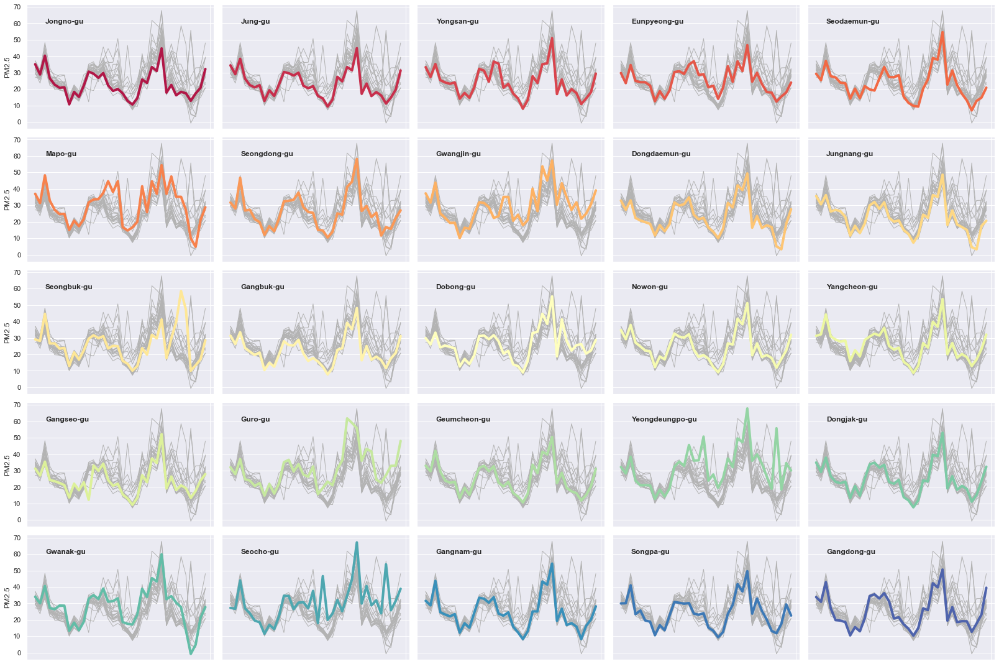

In [16]:
# plot each line one by one comparing with the silhouette of the others

# creating the plot
g = sns.relplot(data = df_monthly, x ='ym', y='PM2.5',
                col  = 'district', hue='district',
                kind = 'line', palette='Spectral',
                linewidth = 4, zorder = 5,
                col_wrap = 5, height = 3, aspect = 1.5, legend = False)

# add text and silhouettes using a for loop and the previous ax chart
for time, ax in g.axes_dict.items():
    ax.text(.1, .85, time,
            transform = ax.transAxes, fontweight='bold')
    
    sns.lineplot(data = df_monthly, x ='ym', y='PM2.5', units='district',
                 estimator = None, color='.7', linewidth=1, ax=ax)

ax.set_xticks('')
g.set_titles("")
g.set_axis_labels('', 'PM2.5')
g.tight_layout()

This type of chart also could work for clusters... check that and how.

______________________________________________________________________________
Comparing **month by month** the behavior for all districts

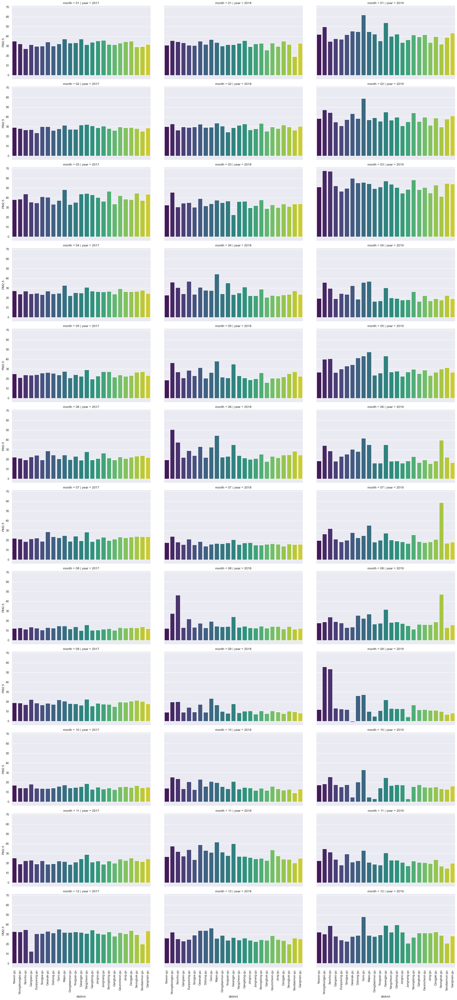

In [17]:
# creating the chart
g_m_b_m = sns.FacetGrid(df_monthly, col='year', row='month', 
                        height=4.2, aspect=1.9)

g_m_b_m = g_m_b_m.map(sns.barplot, 'district', 'PM2.5', palette='viridis', 
                      ci=None, order=list_district)

g_m_b_m.set_xticklabels(rotation=90)          # angle to rotate x labels in the bottom

plt.show()

This plot shows vertically all months in a year and horizontally the same month for each year

____________________________________________________________________________
Plotting using color with **heat map**

In [18]:
# pivot the dataframe
df_pivot = pd.pivot_table(df_monthly,                 # data used in the pivot table
                          values='PM2.5',             # values in the pivot table - average by default
                          index='district',           # lines in the pivot table
                          columns='ym')               # columns in the pivot table

df_pivot

ym,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,...,2019-03,2019-04,2019-05,2019-06,2019-07,2019-08,2019-09,2019-10,2019-11,2019-12
district,,,,,,,,,,,,,,,,,,,,,
Dobong-gu,29.938172,26.101190,33.245968,24.245833,25.389785,24.570833,23.674731,12.673387,17.268056,14.159946,...,55.300766,18.795549,41.342898,28.261111,22.337483,25.601648,26.211656,20.478495,22.380556,28.894809
Dongdaemun-gu,32.892473,27.238095,32.967742,22.276389,20.774194,19.733333,18.737903,11.646505,17.954167,14.250000,...,49.373563,16.368567,23.486370,16.206944,17.882434,16.701351,5.029141,3.223118,18.748611,27.607923
Dongjak-gu,34.952957,29.187500,37.931452,26.590278,23.169355,22.398611,23.310484,13.271505,20.622222,14.750000,...,53.065134,19.164117,26.606887,18.375000,20.756570,18.861644,11.150307,15.267473,23.637500,32.411202
Eunpyeong-gu,29.771505,23.595238,34.607527,24.941667,24.189516,24.125000,22.129032,12.572581,18.712500,14.106183,...,46.705545,24.499305,29.926829,23.079167,18.219917,17.824897,12.380368,15.455645,17.930556,23.964481
Gangbuk-gu,31.387097,26.311012,33.530914,23.969444,21.713710,19.647222,21.142473,10.440860,14.944444,12.534946,...,48.159004,16.389430,25.091822,16.687500,18.677732,16.542582,11.670245,17.536290,20.952778,31.173497
Gangdong-gu,33.797043,30.922619,42.892473,27.000000,19.787634,19.504167,18.595430,10.498656,15.556944,12.981183,...,50.542146,19.477051,27.668580,18.529167,19.156293,19.087838,12.699387,17.689516,23.179167,39.494536
Gangnam-gu,31.529570,28.763393,43.662634,24.643056,23.193548,22.076389,23.450269,12.126344,17.863889,15.145161,...,54.191571,19.324061,26.741750,16.805556,17.944675,15.898649,8.274540,16.293011,20.120833,28.166667
Gangseo-gu,31.284946,27.037202,35.482527,24.338889,23.581989,22.508333,21.232527,13.684140,22.069444,18.051075,...,52.208413,19.152990,26.460545,18.179167,21.027663,19.367072,13.357362,17.668011,23.962500,27.913934
Geumcheon-gu,33.009409,29.656250,42.028226,29.568056,23.959677,22.655556,23.217742,13.178763,19.681944,15.272849,...,50.526820,22.385257,28.734577,19.497222,17.432918,16.335135,11.828221,15.133065,20.475000,31.133880


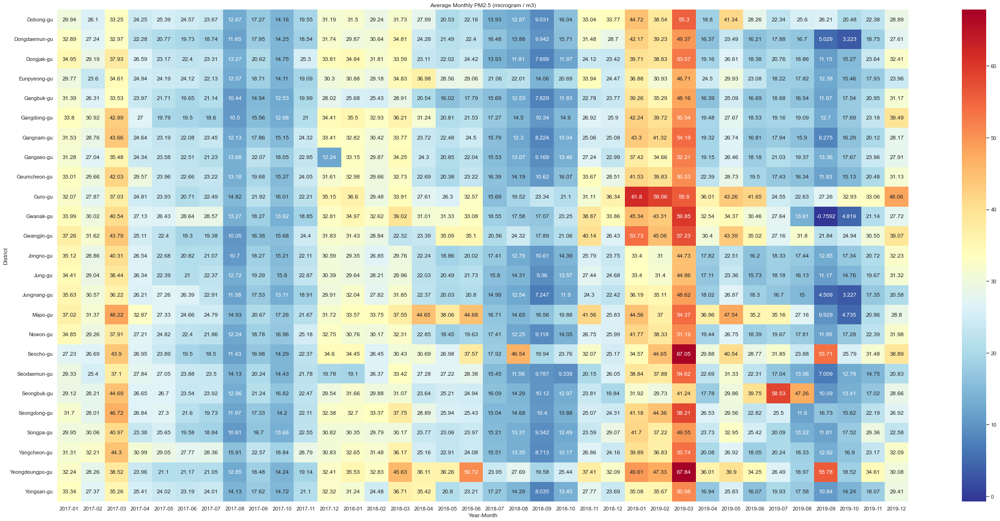

In [19]:
# plotting the heat map

# shaping the chart
plt.figure(figsize= (40,19))
plt.title('Average Monthly PM2.5 (microgram / m3)')

# creating the chart
sns.heatmap(df_pivot, annot=True, cmap='RdYlBu_r', fmt='.4g',)
plt.xlabel('Year-Month')
plt.ylabel('District')
plt.show()

______________________________________________________________________________
Plotting an **interactive radar** chart

In [20]:
# filter the data set for one year to compare month by month
df_19 = df_monthly[df_monthly['year']=='2019']

In [21]:
# creating the interactive radar chart

# extract color palette - change color palette
pal = list(sns.color_palette(palette='viridis', n_colors=len(list_scode)).as_hex())

months = list(reversed([str(i) for i in list(range(1,13))])) + ['12']
## create a list from 12 to 1 and then 12 again

list_pm = [[list(df_19[df_19['district']==i]['PM2.5'])[int(n)-1] for n in months] for i in list_district]
## creat a list with monthly value for PM2.5 for each district

# create the chart using a for loop
fig = pgo.Figure()
for pm, d, c in zip(list_pm, list_district, pal):
    fig.add_trace(pgo.Scatterpolar(r = pm, theta=months, fill=None,
                                  name=str(d), marker=dict(color = c)))
    
fig.update_layout(polar = dict(radialaxis = dict(visible = True, range=[0, 70]),
                              angularaxis = dict(rotation=90)),
                  showlegend=True, width=720, height=720,
                  font = dict(size=14))

fig.show()

Select the district clicking in the list

In [22]:
# filling the radar area one by one

# creating and filling the chart
keep_figname=[]
for i in list_district:
    fig = pgo.Figure()
    for d,pm, c in zip(list_district, list_pm, pal):
        
        # fill the radar
        if i == d:
            fig.add_trace(pgo.Scatterpolar(r = pm, theta=months, fill='toself', # just fill the district in each iteration
                                          name=str(d), marker= dict(color=c)))
        else:
            fig.add_trace(pgo.Scatterpolar(r =pm, theta=months, fill=None,     
                                          name=str(d), marker = dict(color=c)))
    
    # update layout
    fig.update_layout(polar = dict(radialaxis  = dict(visible = True, range=[0,70]),
                                   angularaxis = dict(rotation=90)),
                     showlegend= True, width =720, height =720,
                     font = dict(size = 12), title=i, title_x=0.5)
    
    # export the figure
    keep_figname.append('.//charts/radar_' + i + '.png') #
    fig.write_image('.//charts/radar_' + i + '.png')
#    fig.show()                                          # avoid showing all the charts       
## create a radar chart for each district compared with the others

In [23]:
# define the function to create the collage

def get_collage(cols_n, rows_n, width, height, input_sname, save_name):
    c_width  = width//cols_n
    c_height = height//rows_n
    size     = c_width, c_height
    new_im   = Image.new('RGB', (width, height))
    ims      = []
    for p in input_sname:
        im = Image.open(p)
        im.thumbnail(size)
        ims.append(im)
    i, x, y = 0,0,0
    for col in range(cols_n):
        for row in range(rows_n):
            print(i, x, y)
            new_im.paste(ims[i], (x,y))
            i += 1
            y += c_height
        x += c_width
        y = 0
    new_im.save(save_name)
    return ax                  
#    return was not  in the template

In [24]:
# create the collage

# width = number of columns * fig size // height = number of rows * fig size

get_collage(5, 5, 3600, 3600, keep_figname, './/charts/Collage_radar.jpg')
## save the collage in the charts folder

0 0 0
1 0 720
2 0 1440
3 0 2160
4 0 2880
5 720 0
6 720 720
7 720 1440
8 720 2160
9 720 2880
10 1440 0
11 1440 720
12 1440 1440
13 1440 2160
14 1440 2880
15 2160 0
16 2160 720
17 2160 1440
18 2160 2160
19 2160 2880
20 2880 0
21 2880 720
22 2880 1440
23 2880 2160
24 2880 2880


<AxesSubplot:>

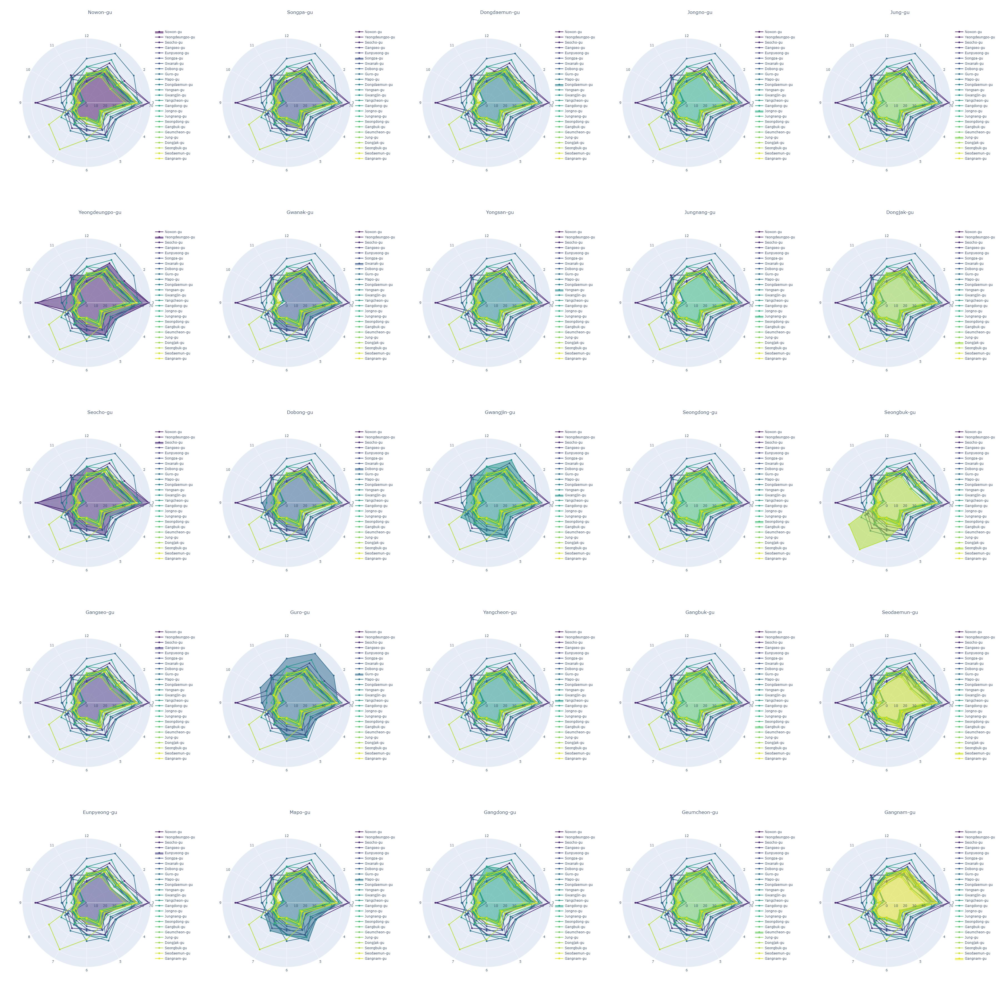

In [25]:
# showing the radar collage
ipimage(filename='.//charts/Collage_radar.jpg')

**Circular** bar plot<br>

This chart is good to get attention for those categories with high frequency / average

In [26]:
# define the function to create the circular plot

# set the max value
max_val = max(df_19['PM2.5'])*1.001
pal = list(sns.color_palette(palette='YlOrRd', n_colors=len(list_district)).as_hex())

# user defined function
def circular_bar(input_df, column_name, title):
    plt.gcf().set_size_inches(12, 12)
    ax = plt.subplot(projection = 'polar')
    input_df.reset_index(inplace=True, drop = True)
    for i in range(len(input_df)):
        ax.barh(i, input_df[column_name][i]*2*np.pi/max_val, 
                label=input_df['district'][i],
               color =pal[i])

    ax.set_theta_zero_location('N')
    ax.set_theta_direction(1)
    ax.set_rlabel_position(0)
    ax.set_thetagrids([], labels=[])
    ax.set_rgrids(range(len(input_df)), labels=input_df['district'])
    
    ax = plt.subplot(projection = 'polar')
    plt.title("Average PM2.5 // " + title)
    return ax


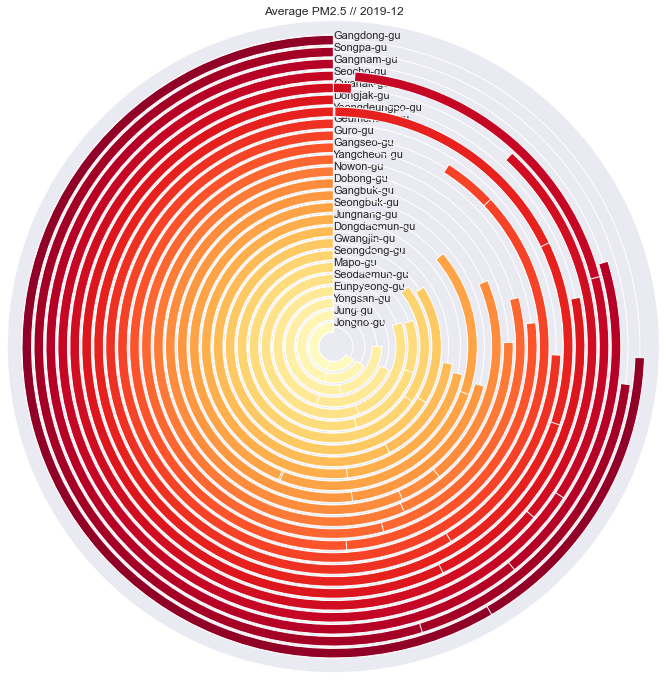

In [27]:
# apply the function

# creating the list for the plot for month, year, yeat-month
list_month19 = list(set(df_19['month']))
list_ym19    = list(set(df_19['ym']))
list_ym19.sort()
listdf_monthly19 = [df_19[df_19['month'] == str(i)] for i in list_month19]

# creating the chart
keep_sname = []
order = range(len(listdf_monthly19))
for i in order:
    circular_bar(listdf_monthly19[i], 'PM2.5', list_ym19[i])
    keep_sname.append('.//charts/cir_bar_' + str(i) + '.png')
    plt.savefig('.//charts/cir_bar_' + str(i) + '.png')
#    plt.show()                                           # avoid showing all the charts 
    


In [28]:

# to create a fit photo collage: 
# width = number of columns * figure size // height = number of rows * figure size   

get_collage(3, 4, 2592, 3456, keep_sname, './/charts/Collage_cir_bar.jpg')
## save the collage in the charts folder

0 0 0
1 0 864
2 0 1728
3 0 2592
4 864 0
5 864 864
6 864 1728
7 864 2592
8 1728 0
9 1728 864
10 1728 1728
11 1728 2592


<AxesSubplot:>

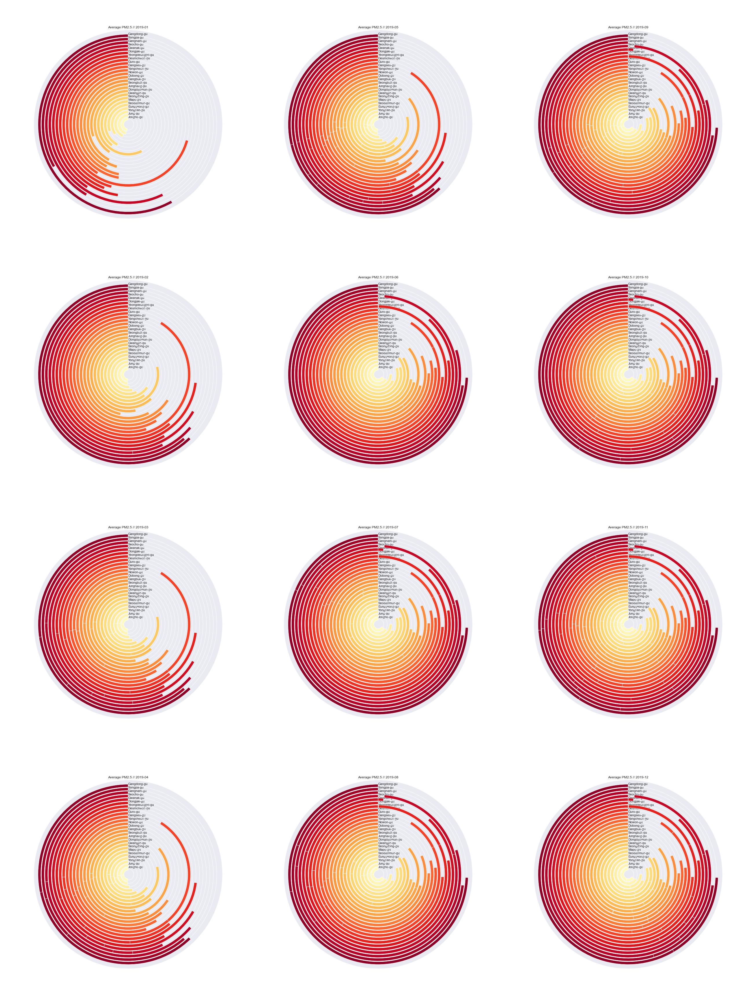

In [29]:
# showing the radar collage
ipimage(filename='.//charts/Collage_cir_bar.jpg')

Radial plot starting from **the center**

In [30]:
# defining the function

# set color palette, lower and max values
pal = list(sns.color_palette(palette='CMRmap_r', n_colors=len(list_district)).as_hex())
lower_limit = 0
max_v = df_19['PM2.5'].max()

# defining the function
def radial_plot(input_df, column_name, title):
    input_df.reset_index(inplace = True, drop = True)
    plt.figure(figsize=(12,12))
    ax = plt.subplot(111, polar = True)
    plt.axis()
    
    heights = input_df[column_name]
    width   = 2*np.pi / len(input_df.index)
    
    indexes = list(range(1, len(input_df.index) +1))
    angles  = [element * width for element in indexes]
    
    bars = ax.bar(x=angles, height =heights, width = width,
                 bottom=lower_limit,
                 linewidth=1, edgecolor='white', color=pal)
    labelPadding = 2
    
    for bar, angle, height, label in zip(bars, angles, heights, list_district):
        rotation = np.rad2deg(angle)
        alignment = ""
        
        if angle > np.pi/2 and angle < 3*np.pi/2:
            alignment = "right"
            rotation = rotation + 180
        else: 
            alignment = "left"
            
        ax.text(x=angle, y=lower_limit + bar.get_height() + labelPadding,
               s=label, ha = alignment, va = "center", rotation=rotation,
               rotation_mode = "anchor")
        
        ax.set_thetagrids([], labels=[])
        plt.title("Average PM2.5 // " + title)
    return ax

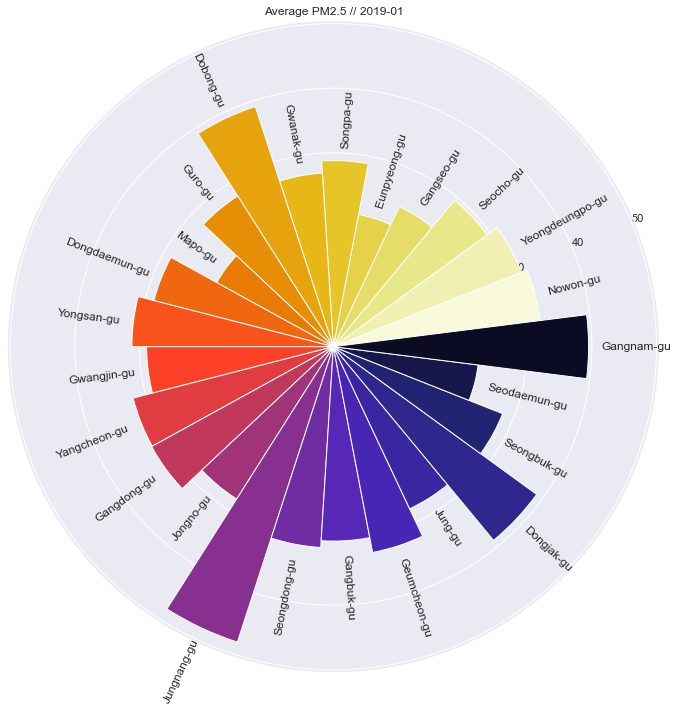

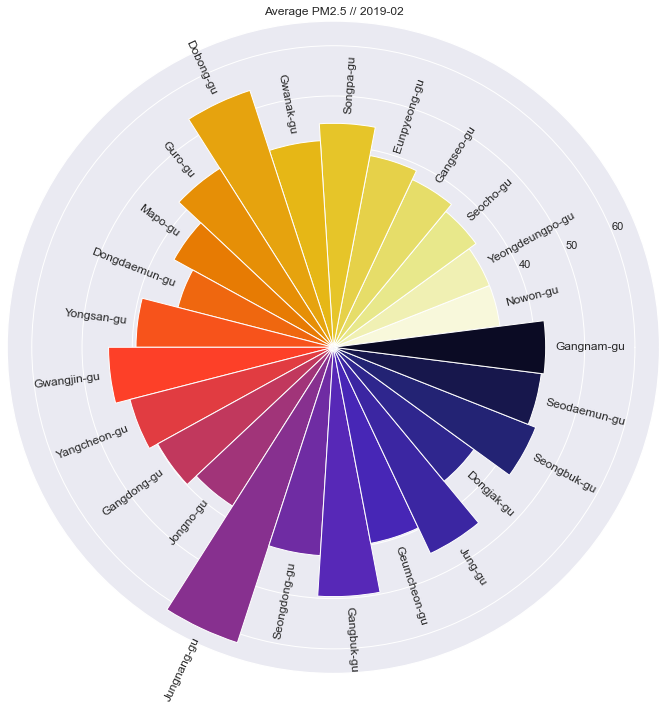

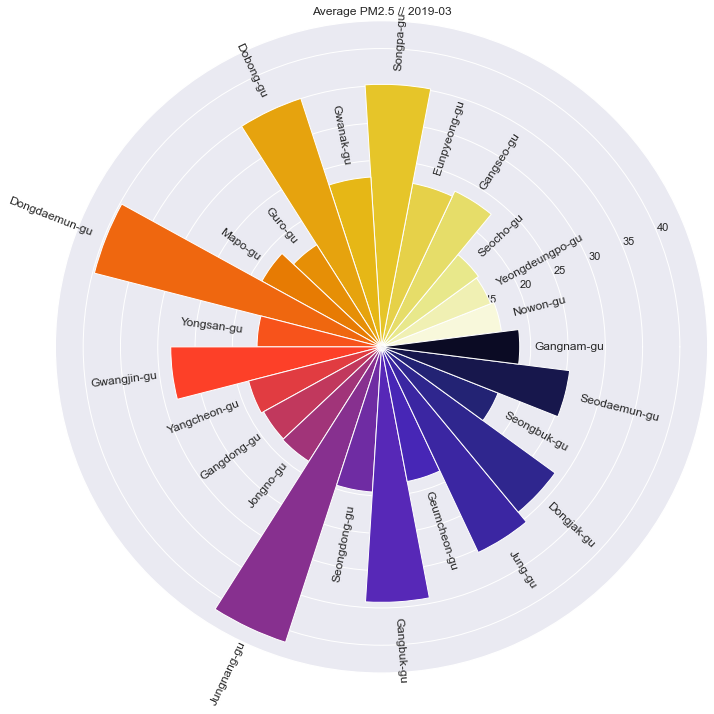

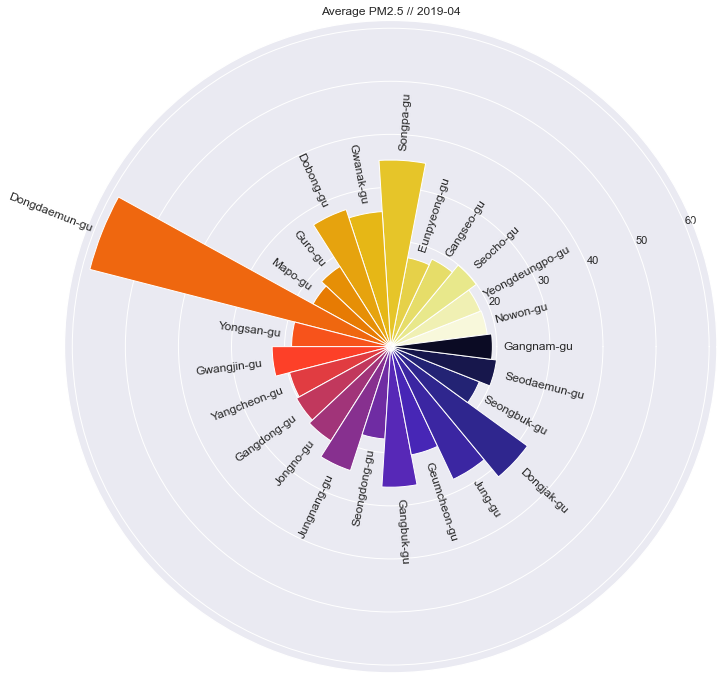

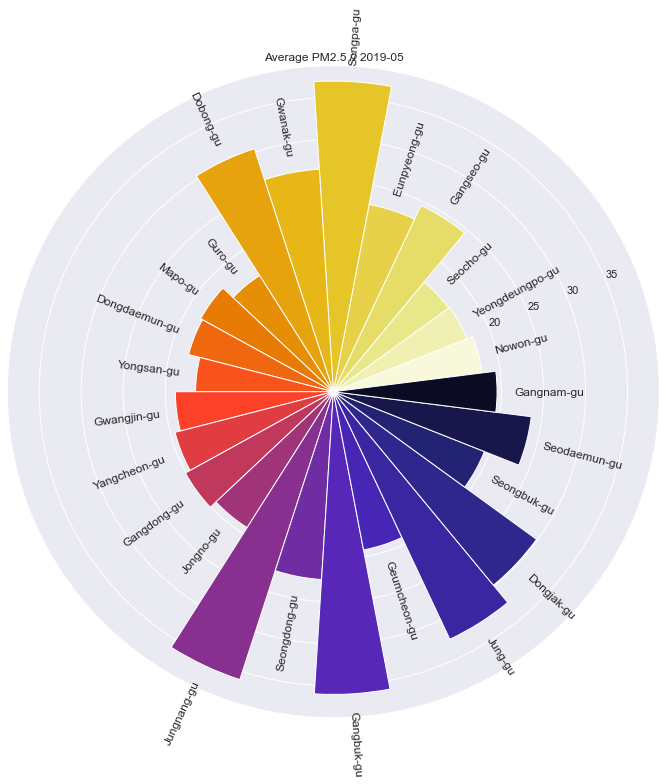

...

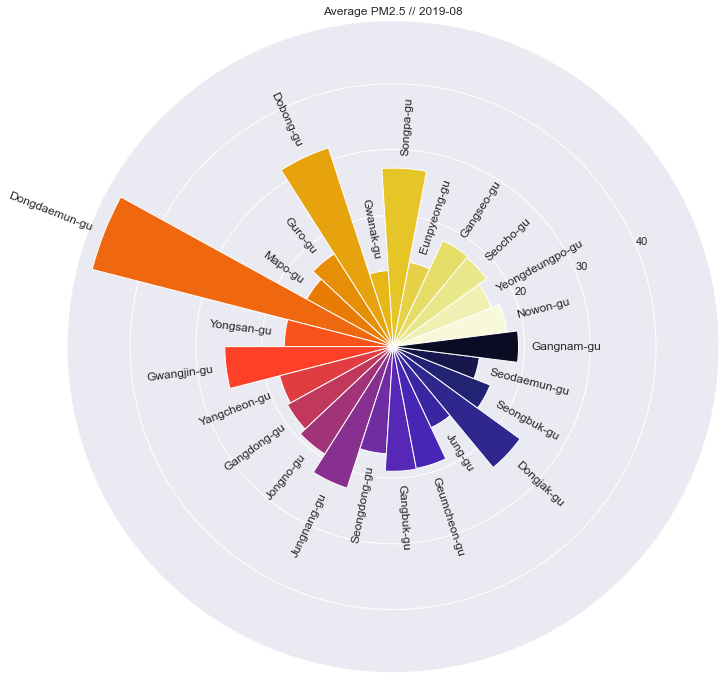

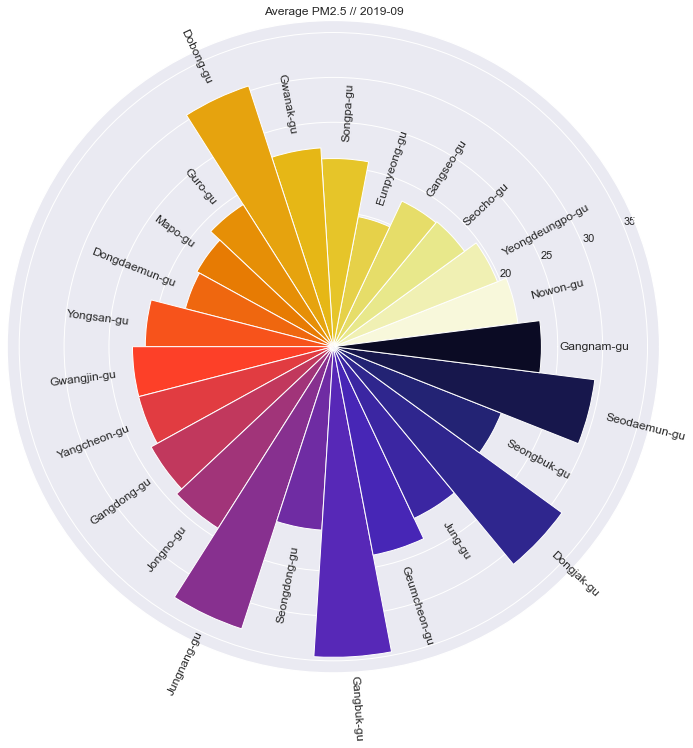

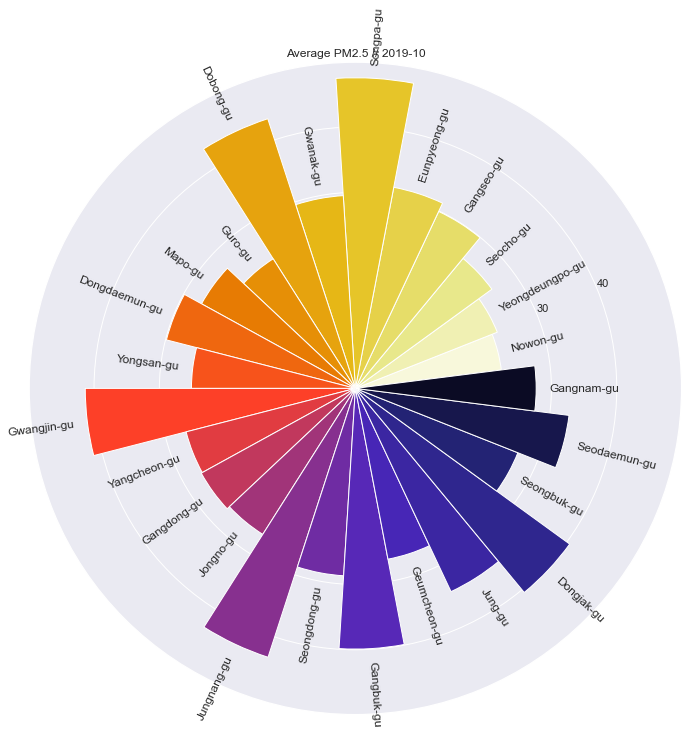

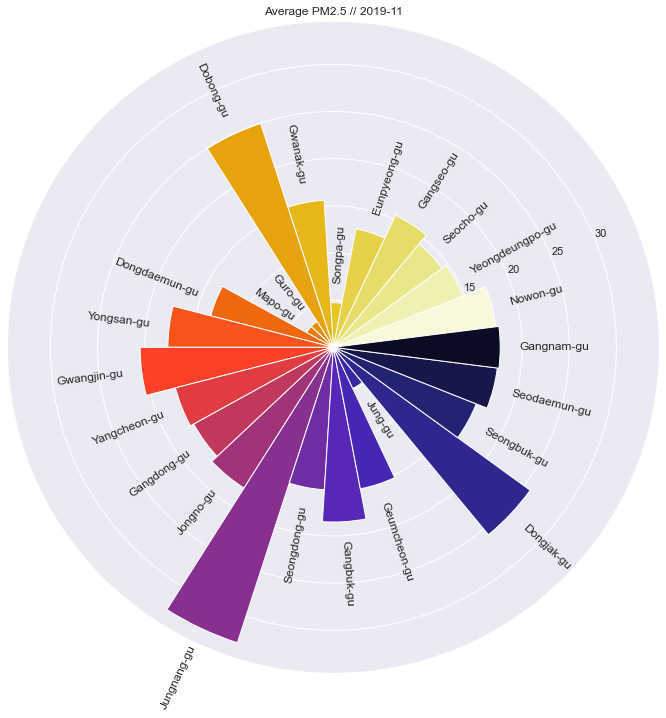

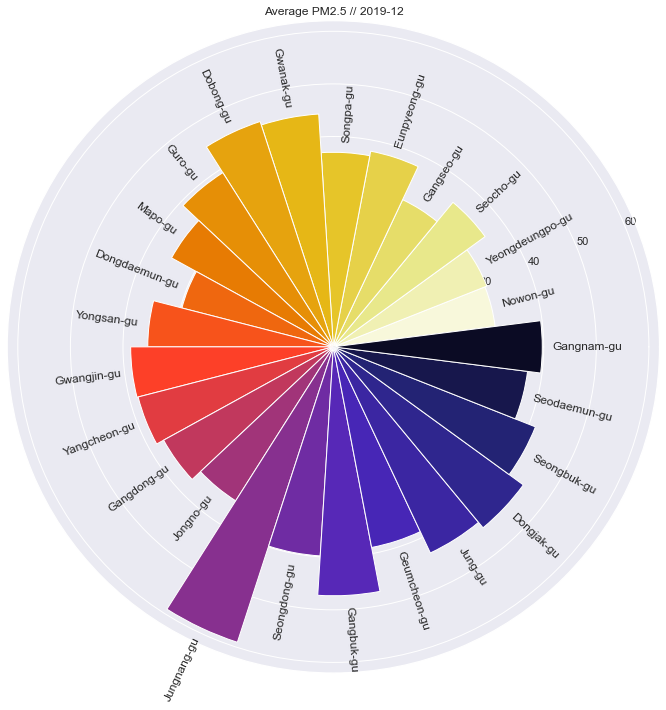

In [31]:
# apply the function
keep_sname =[]
order = range(len(listdf_monthly19))

for i in order:
    radial_plot(listdf_monthly19[i], 'PM2.5', list_ym19[i])
    keep_sname.append('.//charts/rad_bar_' + str(i) + '.png')
    plt.savefig('.//charts/rad_bar_' + str(i) + '.png')
#    plt.show()                                       # avoid showing all the charts 

In [32]:

# to create a fit photo collage: 
# width = number of columns * figure size // height = number of rows * figure size  

get_collage(3, 4, 2592, 3456, keep_sname, './/charts/Collage_rad_bar.png')
## save the collage in the charts folder

0 0 0
1 0 864
2 0 1728
3 0 2592
4 864 0
5 864 864
6 864 1728
7 864 2592
8 1728 0
9 1728 864
10 1728 1728
11 1728 2592


<AxesSubplot:>

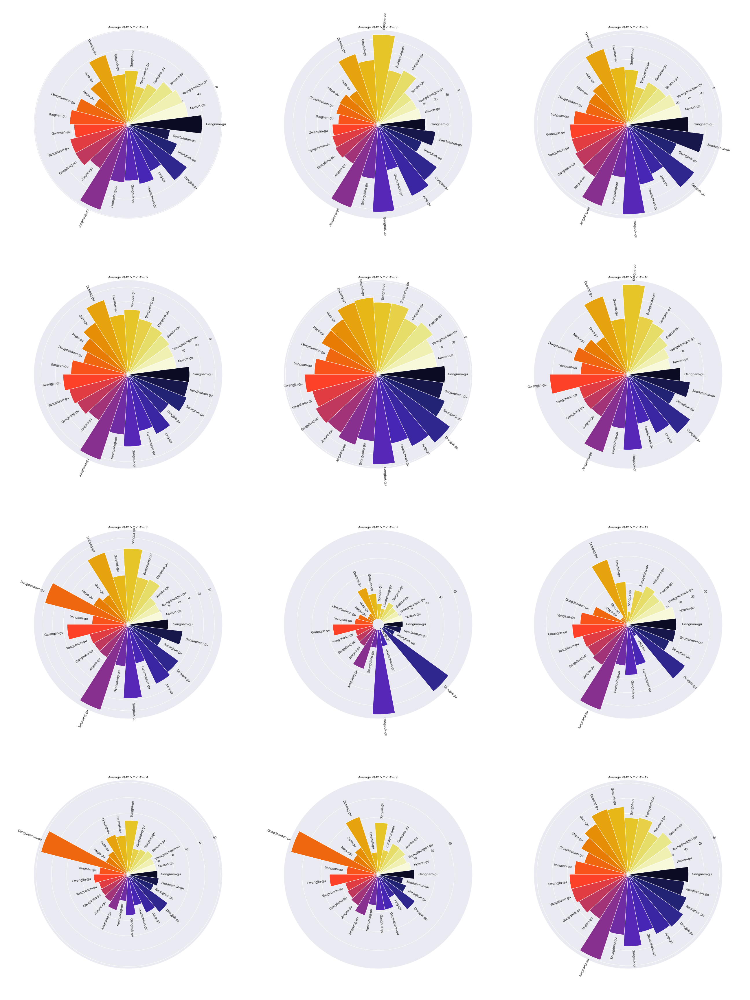

In [33]:
# showing the radar collage
ipimage(filename='.//charts/Collage_rad_bar.png')

_______________________________________________________________________________
**Density** maps

In [34]:
# define function for density map

# change color scale for 12 months
pal = list(sns.color_palette(palette='viridis', n_colors=len(list_month19)).as_hex())

#define function
def kde_ridge(df_input, col_name, time, title):
    sns.set_theme(style='white', rc={"axes.facecolor": (0, 0, 0, 0)})
    
    # initialize the FacetGrid object
    g = sns.FacetGrid(df_input, row = time, hue = time,
                    aspect = 15, height = 0.65, palette = pal)
    
    # draw the densities in few steps
    g.map(sns.kdeplot, col_name, bw_adjust = .5, clip_on = False,
          fill = True, alpha = 1, linewidth = 1.5)
    g.map(sns.kdeplot, col_name, clip_on = False, color ='w', lw=2, 
          bw_adjust = .5)
    
    # passing color=None to refline() uses the hue mapping
    g.map(plt.axhline, y = 0, linewidth = 2, linestyle = "-",
          color = None, clip_on = False)
    
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .2, label, fontweight = "bold", color = color,
                ha = "left", va = "center", transform=ax.transAxes)
    
    g.map(label, time)
    
    # set the subplots
    g.fig.subplots_adjust(hspace=-.25)
    
    # remove axes details that don't play well with everlap
    g.set_titles("")
    g.set(yticks = [], ylabel = "", xlabel = title + ' PM2.5')
    g.despine(bottom = True, left = True)
    
    return g
    

C:\Users\USER\anaconda3\lib\site-packages\seaborn\axisgrid.py:409: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



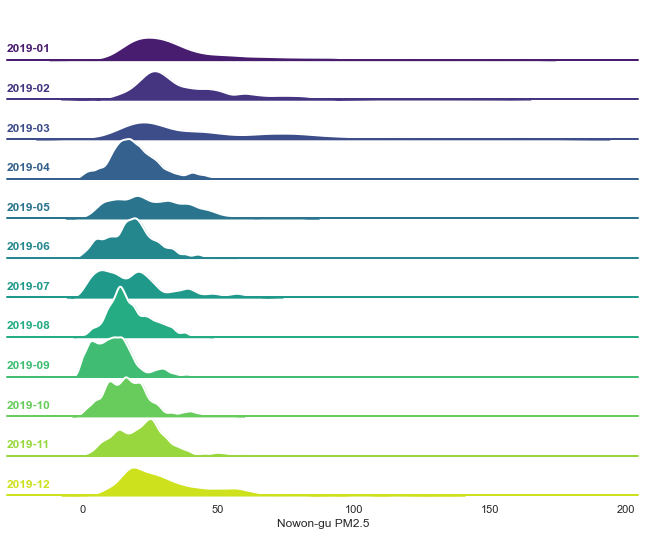

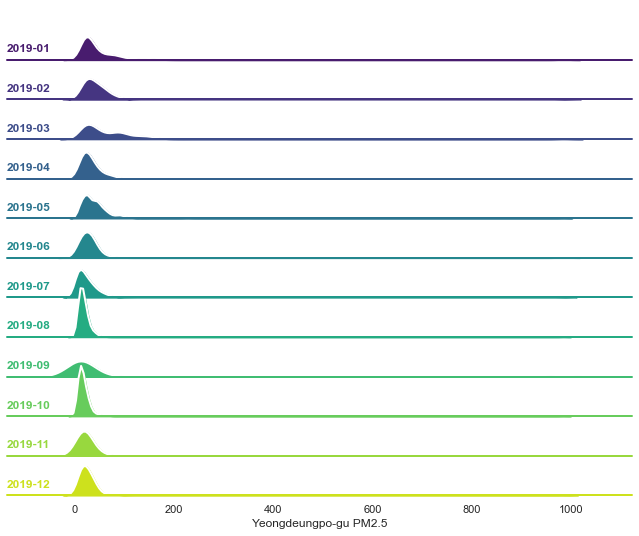

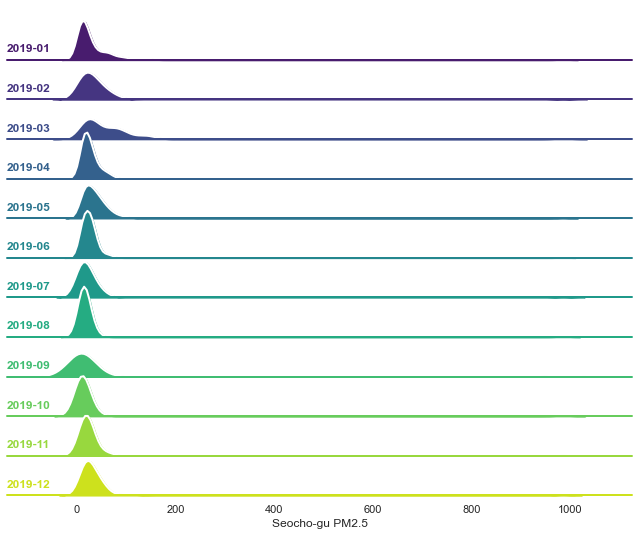

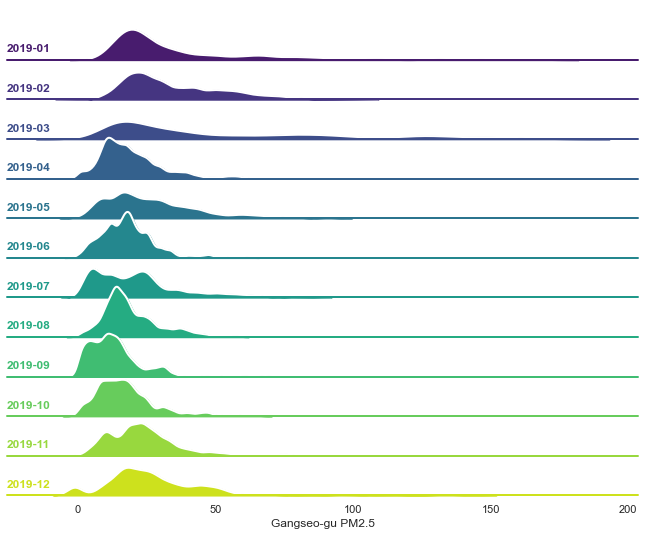

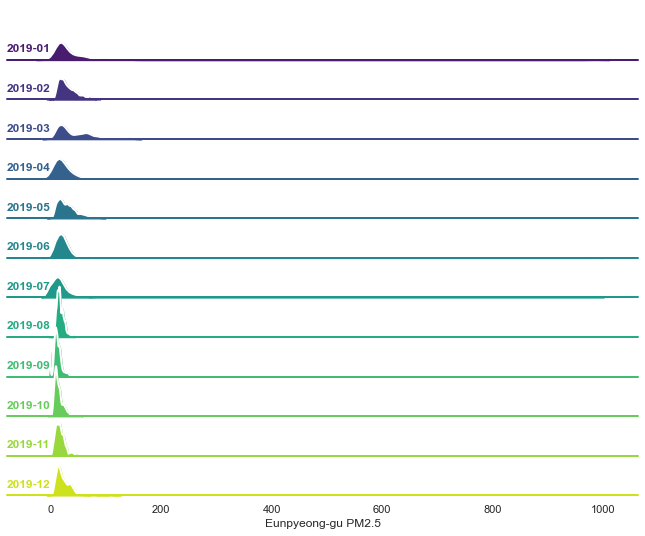

...

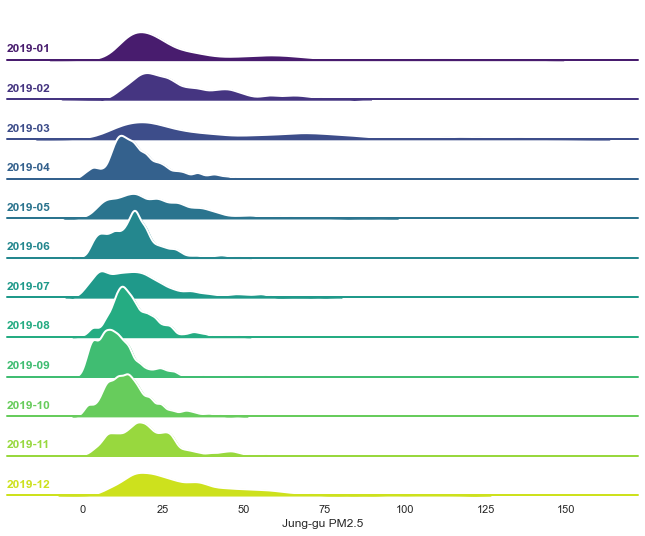

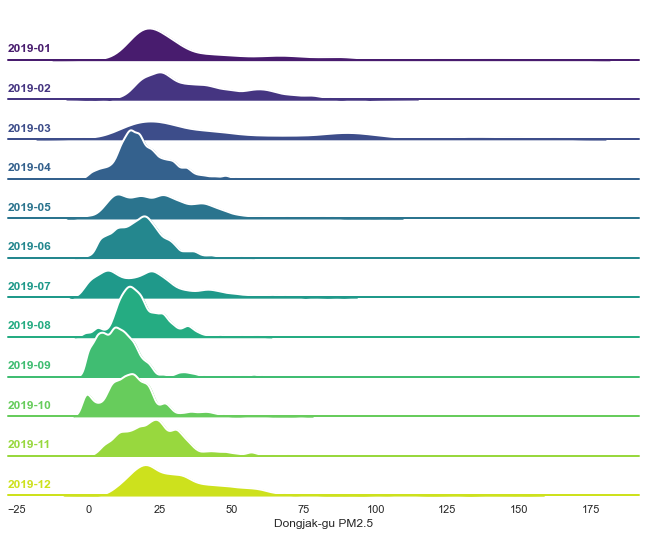

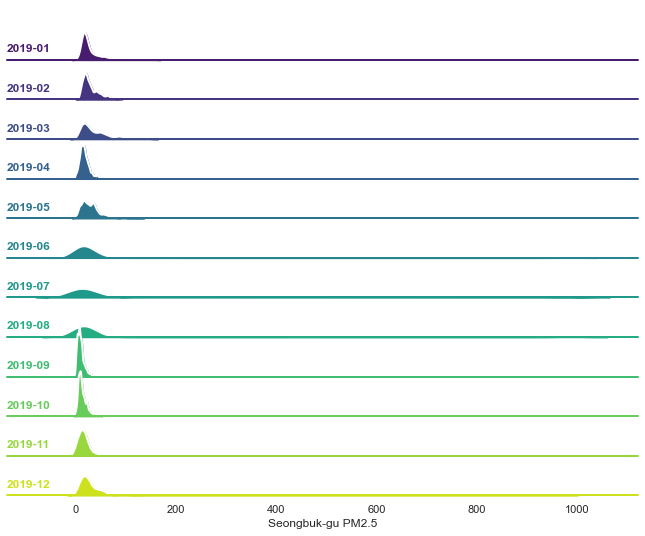

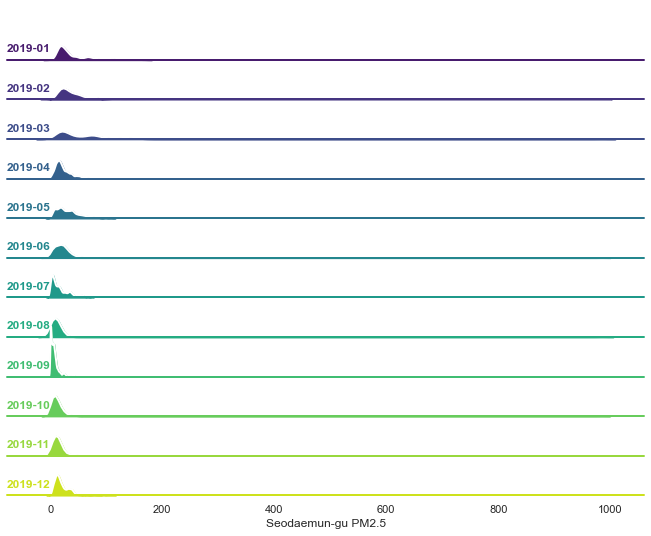

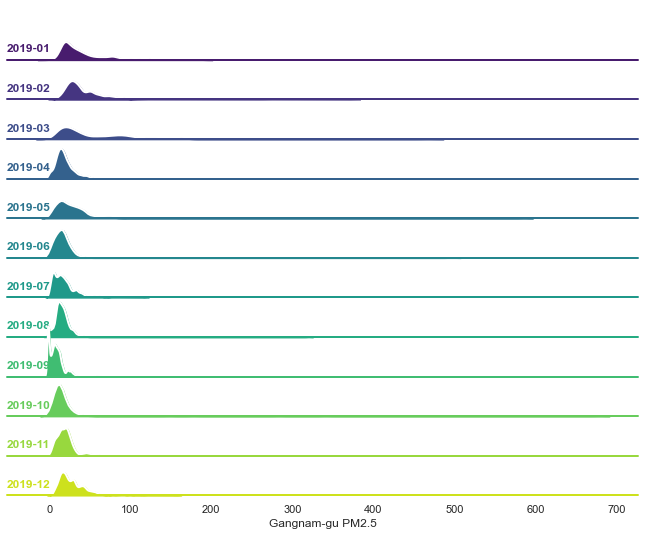

In [35]:
# apply the function

# use hourly data
df_hour19  = df[df['year'] == '2019']
df_hd19 = [df_hour19[df_hour19['district'] == i] for i in list_district]

# create the plot
keep_sname = []
order = range(len(list_district))

for i in order:
    kde_ridge(df_hd19[i], 'PM2.5', 'ym', list_district[i])
    keep_sname.append('.//charts/kde_' + str(i) + '.png')
    plt.savefig('.//charts/kde_' + str(i) + '.png')
#    plt.show()                                    # avoid showing all the charts 

In [36]:
# create the collage

# width = number of columns * figure size // hieght = number of rows * figure size

get_collage(5, 5, 3510, 2805, keep_sname, './/charts/Collage_kde_ridge.jpg')
## save the collage in the charts folder

0 0 0
1 0 561
2 0 1122
3 0 1683
4 0 2244
5 702 0
6 702 561
7 702 1122
8 702 1683
9 702 2244
10 1404 0
11 1404 561
12 1404 1122
13 1404 1683
14 1404 2244
15 2106 0
16 2106 561
17 2106 1122
18 2106 1683
19 2106 2244
20 2808 0
21 2808 561
22 2808 1122
23 2808 1683
24 2808 2244


<AxesSubplot:>

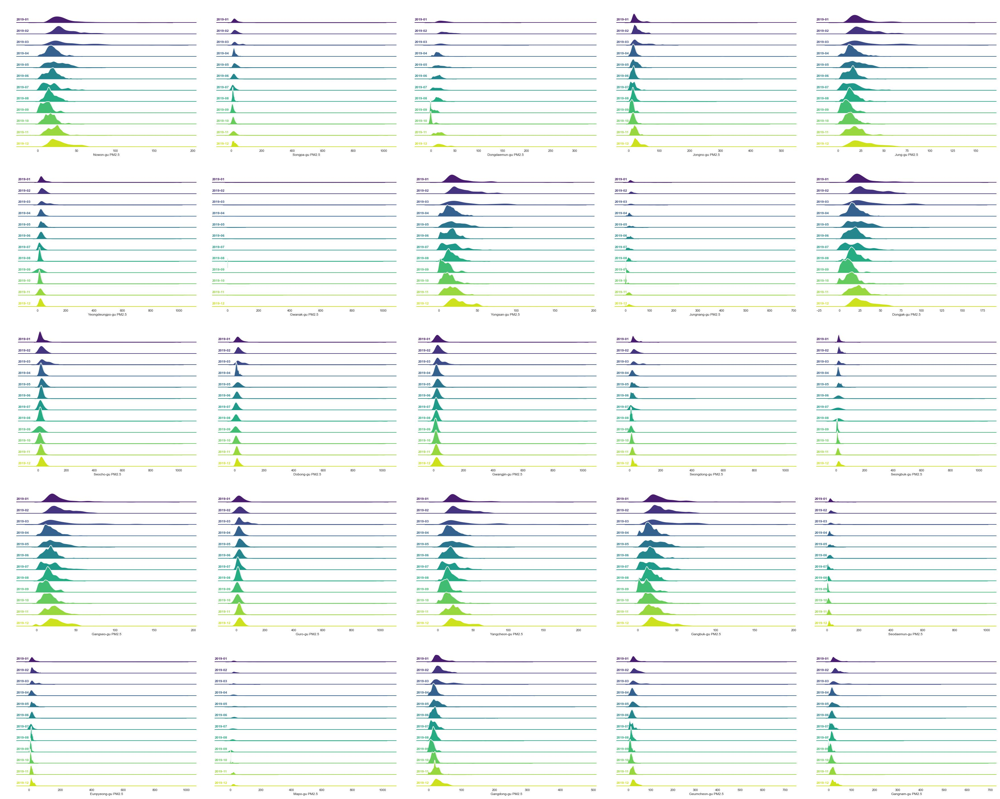

In [37]:
# showing the radar collage
ipimage(filename='.//charts/Collage_kde_ridge.jpg')